# Comparing Machine Learning Algorithms for Alzheimer's Disease Classification

### Initial Data Fetching and Cleaning 



### Setting up to use Kaggle API

In order to retrieve dataset via API, user needs to (1) create a Kaggle account, (2) go to 'Account', and (3) click on 'Create New Token' under the API section. A json file containing your username and API key will download.

Copy this json file into the directory containing this notebook. For your reference, there is an empty one as an example.

If you have any issues, see here for more info: https://github.com/Kaggle/kaggle-api/blob/main/docs/README.md

When downloading the dataset files from Kaggle, may happen that you would receive an SSL error message. This may happen if you are working on corporate-managed device, and throws a certificatie verification error. If you have trouble fetching, you can just skip to reading in copy from data/source.

In [1]:
# Import other libraries first
import pandas as pd
import os
import json

# Install kaggle first using pip (exact method varies depending on set up)
!pip3 install kaggle

# Open the file and load the data
with open('kaggle.json', 'r') as file:
    data = json.load(file)

# Extract username and key
username = data.get('username')
key = data.get('key')

# Set username and key as environment variables
os.environ['KAGGLE_USERNAME'] = username
os.environ['KAGGLE_KEY'] = key

# Now you should be able to import kaggle
import kaggle


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip3 install --upgrade pip


In [2]:
# Authenticate (uses username and key) and download dataset (set unzip to True)
kaggle.api.authenticate()

# Downloads to 'source' directory
kaggle.api.dataset_download_files('rabieelkharoua/alzheimers-disease-dataset', path='data/source', unzip=True)

Dataset URL: https://www.kaggle.com/datasets/rabieelkharoua/alzheimers-disease-dataset


In [2]:
# Read in downloaded data using pandas and print out
import pandas as pd
data = pd.read_csv('data/source/alzheimers_disease_data.csv')
print(data)

      PatientID  Age  Gender  Ethnicity  EducationLevel        BMI  Smoking  \
0          4751   73       0          0               2  22.927749        0   
1          4752   89       0          0               0  26.827681        0   
2          4753   73       0          3               1  17.795882        0   
3          4754   74       1          0               1  33.800817        1   
4          4755   89       0          0               0  20.716974        0   
...         ...  ...     ...        ...             ...        ...      ...   
2144       6895   61       0          0               1  39.121757        0   
2145       6896   75       0          0               2  17.857903        0   
2146       6897   77       0          0               1  15.476479        0   
2147       6898   78       1          3               1  15.299911        0   
2148       6899   72       0          0               2  33.289738        0   

      AlcoholConsumption  PhysicalActivity  DietQua

In [7]:
# Print out head
data.head()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,0,0,1.725883,0,0,0,1,0,0,XXXConfid
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,2.592424,0,0,0,0,1,0,XXXConfid
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,7.119548,0,1,0,1,0,0,XXXConfid
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,1,6.481226,0,0,0,0,0,0,XXXConfid
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0.014691,0,0,1,1,0,0,XXXConfid


In [11]:
# Describe data
data.describe()

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
count,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,...,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000,2149.000000
mean,5825.000000,74.908795,0.506282,0.697534,1.286645,27.655697,0.288506,10.039442,4.920202,4.993138,...,5.080055,0.208004,0.156817,4.982958,0.205212,0.158213,0.150768,0.158678,0.301536,0.353653
std,620.507185,8.990221,0.500077,0.996128,0.904527,7.217438,0.453173,5.757910,2.857191,2.909055,...,2.892743,0.405974,0.363713,2.949775,0.403950,0.365026,0.357906,0.365461,0.459032,0.478214
min,4751.000000,60.000000,0.000000,0.000000,0.000000,15.008851,0.000000,0.002003,0.003616,0.009385,...,0.000460,0.000000,0.000000,0.001288,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5288.000000,67.000000,0.000000,0.000000,1.000000,21.611408,0.000000,5.139810,2.570626,2.458455,...,2.566281,0.000000,0.000000,2.342836,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,5825.000000,75.000000,1.000000,0.000000,1.000000,27.823924,0.000000,9.934412,4.766424,5.076087,...,5.094439,0.000000,0.000000,5.038973,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6362.000000,83.000000,1.000000,1.000000,2.000000,33.869778,1.000000,15.157931,7.427899,7.558625,...,7.546981,0.000000,0.000000,7.581490,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,6899.000000,90.000000,1.000000,3.000000,3.000000,39.992767,1.000000,19.989293,9.987429,9.998346,...,9.996467,1.000000,1.000000,9.999747,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Examination of the data

**1.** There are 35 (integer and float) variables in the original dataset.

**2.** For our model-centric approach to identify which machine learning model performs best when classifying Alzheimer’s diagnosis, we will use the below variables, total of 23 columns:
   
   *  **Demographics**
      * Id
      * Age
      * Gender
      * Ethnicity
      * Education level 

   * **Lifestyle Factors**
      * BMI
      * Smoking
      * Alcohol Consumption
      * Physical Activity
      * Diet Quality
      * Sleep Quality

   *  **Medical History**
      * Family History Alzheimers
      * Cardiovascular Disease
      * Diabetes
      * Depression
      * Head Injury
      * Hipertension

   * **Clinical Measurements**
      * SystolicBP
      * DiastolicBP
      * CholesterolTotal
      * Cholesterol ILDL
      * Cholesterol IHDL
      * Cholesterol Triglycerides

**3.** To compare the performance of the 23-variable model to the 9-variable model (based on prior work), we will use the below variables.
      * Education level
      * BMI
      * Smoking
      * Alcohol Consumption
      * Physical Activity
      * Depression
      * Head Injury
      * Diabetes
      * CholesterolTotal

**4.** Using 23-variable dataset, we have looked at:
      * Missing values
      * Outliers
      * Distributions

### Create 23-variable dataset

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PatientID                  2149 non-null   int64  
 1   Age                        2149 non-null   int64  
 2   Gender                     2149 non-null   int64  
 3   Ethnicity                  2149 non-null   int64  
 4   EducationLevel             2149 non-null   int64  
 5   BMI                        2149 non-null   float64
 6   Smoking                    2149 non-null   int64  
 7   AlcoholConsumption         2149 non-null   float64
 8   PhysicalActivity           2149 non-null   float64
 9   DietQuality                2149 non-null   float64
 10  SleepQuality               2149 non-null   float64
 11  FamilyHistoryAlzheimers    2149 non-null   int64  
 12  CardiovascularDisease      2149 non-null   int64  
 13  Diabetes                   2149 non-null   int64

TypeError: 'Index' object is not callable

In [3]:
# Set list of columns that we want to keep for 23-variable model (23 predictors, 1 outcome)

columns_to_keep_23 = ['PatientID', 'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI',
       'Smoking', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality',
       'SleepQuality', 'FamilyHistoryAlzheimers', 'CardiovascularDisease',
       'Diabetes', 'Depression', 'HeadInjury', 'Hypertension', 'SystolicBP',
       'DiastolicBP', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
       'CholesterolTriglycerides','Diagnosis']

# Create a new DataFrame with only those columns
data_23 = data[columns_to_keep_23]
data_23

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,Depression,HeadInjury,Hypertension,SystolicBP,DiastolicBP,CholesterolTotal,CholesterolLDL,CholesterolHDL,CholesterolTriglycerides,Diagnosis
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,1,0,0,142,72,242.366840,56.150897,33.682563,162.189143,0
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,0,115,64,231.162595,193.407996,79.028477,294.630909,0
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,0,99,116,284.181858,153.322762,69.772292,83.638324,0
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,0,0,118,115,159.582240,65.366637,68.457491,277.577358,0
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0,94,117,237.602184,92.869700,56.874305,291.198780,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,6895,61,0,0,1,39.121757,0,1.561126,4.049964,6.555306,...,0,0,0,122,101,280.476824,94.870490,60.943092,234.520123,1
2145,6896,75,0,0,2,17.857903,0,18.767261,1.360667,2.904662,...,0,0,0,152,106,186.384436,95.410700,93.649735,367.986877,1
2146,6897,77,0,0,1,15.476479,0,4.594670,9.886002,8.120025,...,0,0,0,115,118,237.024558,156.267294,99.678209,294.802338,1
2147,6898,78,1,3,1,15.299911,0,8.674505,6.354282,1.263427,...,0,0,0,103,96,242.197192,52.482961,81.281111,145.253746,1


In [24]:
# Set list of columns that we want to keep for 9-variable model (9 predictors, 1 outcome)
columns_to_keep_9 = ['PatientID', 'EducationLevel', 'BMI',
       'Smoking', 'AlcoholConsumption', 'PhysicalActivity',
       'Diabetes', 'Depression', 'HeadInjury', 'CholesterolTotal', 'Diagnosis']

# Create a new DataFrame with only those columns
data_9 = data[columns_to_keep_9]
data_9

,PatientID,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,Diabetes,Depression,HeadInjury,CholesterolTotal,Diagnosis
0,4751,2,22.927749,0,13.297218,6.327112,1,1,0,242.366840,0
1,4752,0,26.827681,0,4.542524,7.619885,0,0,0,231.162595,0
2,4753,1,17.795882,0,19.555085,7.844988,0,0,0,284.181858,0
3,4754,1,33.800817,1,12.209266,8.428001,0,0,0,159.582240,0
4,4755,0,20.716974,0,18.454356,6.310461,0,0,0,237.602184,0
...,...,...,...,...,...,...,...,...,...,...,...
2144,6895,1,39.121757,0,1.561126,4.049964,0,0,0,280.476824,1
2145,6896,2,17.857903,0,18.767261,1.360667,0,0,0,186.384436,1
2146,6897,1,15.476479,0,4.594670,9.886002,0,0,0,237.024558,1
2147,6898,1,15.299911,0,8.674505,6.354282,0,0,0,242.197192,1


In [25]:
len(data_9.columns)

11

### High level analysis identifying Missing Data & Adding default Values

We would use **`Missing Data Percentage List`** visualization, as we have wide features in our dataset and we want to analyse each of them. However, we see that there is not any missing values in our dataset:




In [26]:
percent_missing = data_23.isnull().sum() * 100 / len(data_23)
percent_missing

PatientID                   0.0
Age                         0.0
Gender                      0.0
Ethnicity                   0.0
EducationLevel              0.0
BMI                         0.0
Smoking                     0.0
AlcoholConsumption          0.0
PhysicalActivity            0.0
DietQuality                 0.0
SleepQuality                0.0
FamilyHistoryAlzheimers     0.0
CardiovascularDisease       0.0
Diabetes                    0.0
Depression                  0.0
HeadInjury                  0.0
Hypertension                0.0
SystolicBP                  0.0
DiastolicBP                 0.0
CholesterolTotal            0.0
CholesterolLDL              0.0
CholesterolHDL              0.0
CholesterolTriglycerides    0.0
Diagnosis                   0.0
dtype: float64

In [145]:
# Check shape
print(data_23.shape)

(2149, 23)


In [146]:
# Check shape of df when NAs are dropped
data_23.dropna().shape

(2149, 23)

### Checking the datatypes

In the source data, all of the features are numerical (int and float).

However, the following are categorical variables:
* Gender
* Ethnicity
* EducationLevel
* Smoking
* FamilyHistoryAlzheimers
* Diabetes
* CardiovascularDisease
* HeadInjury
* Depression
* Diagnosis

# !TO DO: Finish adding info on all categorical variables
Features Cardiovascular Disease, Diabetes, Depression, HeadInjury and Hypertension (all related with Medical History), have are binary ( where 0 indicates No and 1 indicates Yes). For Ethnicity, the information is classified as follows: 0 Caucasian, 1 African American, 2 Asian and 3 Other.


In [30]:
# Check data types
data_23.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   PatientID                 2149 non-null   int64  
 1   Age                       2149 non-null   int64  
 2   Gender                    2149 non-null   int64  
 3   Ethnicity                 2149 non-null   int64  
 4   EducationLevel            2149 non-null   int64  
 5   BMI                       2149 non-null   float64
 6   Smoking                   2149 non-null   int64  
 7   AlcoholConsumption        2149 non-null   float64
 8   PhysicalActivity          2149 non-null   float64
 9   DietQuality               2149 non-null   float64
 10  SleepQuality              2149 non-null   float64
 11  FamilyHistoryAlzheimers   2149 non-null   int64  
 12  CardiovascularDisease     2149 non-null   int64  
 13  Diabetes                  2149 non-null   int64  
 14  Depressi

In [4]:
# Change data types to categorical
categorical_list = ['Gender', 'Ethnicity', 'EducationLevel',
       'Smoking', 'FamilyHistoryAlzheimers', 'CardiovascularDisease',
       'Diabetes', 'Depression', 'HeadInjury', 'Diagnosis']

for col in categorical_list:
    data_23[col] = data_23[col].astype('category')

data_23.info() # see they have changed

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   PatientID                 2149 non-null   int64   
 1   Age                       2149 non-null   int64   
 2   Gender                    2149 non-null   category
 3   Ethnicity                 2149 non-null   category
 4   EducationLevel            2149 non-null   category
 5   BMI                       2149 non-null   float64 
 6   Smoking                   2149 non-null   category
 7   AlcoholConsumption        2149 non-null   float64 
 8   PhysicalActivity          2149 non-null   float64 
 9   DietQuality               2149 non-null   float64 
 10  SleepQuality              2149 non-null   float64 
 11  FamilyHistoryAlzheimers   2149 non-null   category
 12  CardiovascularDisease     2149 non-null   category
 13  Diabetes                  2149 non-null   catego

/var/folders/gp/mjt2kkpn0ml3xc_8sp5j2m800000gn/T/ipykernel_84498/794022384.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_23[col] = data_23[col].astype('category')


### Outliers 

The below code uses **`Box Plots`** to detect outliers for our numerical variables.



[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: pip3 install --upgrade pip


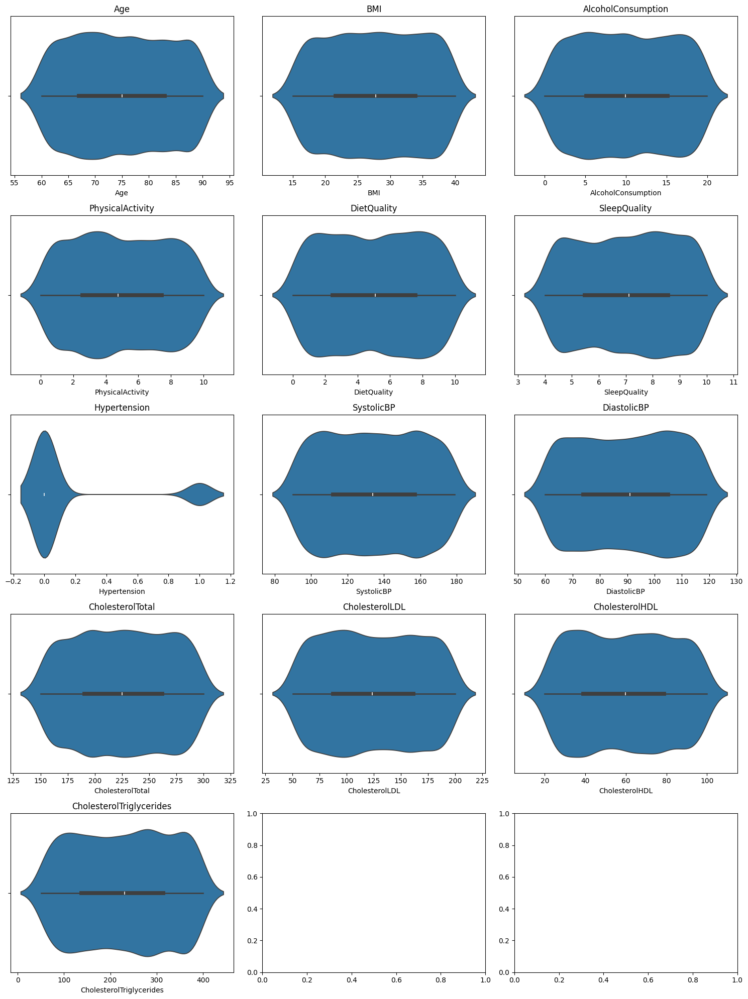

In [44]:
!pip3 install seaborn
import seaborn as sns
import matplotlib.pyplot as plt

features_of_interest = ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality',
                        'SleepQuality', 'Hypertension', 'SystolicBP', 'DiastolicBP', 
                        'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 
                        'CholesterolTriglycerides']

# Set up the matplotlib figure
fig, axes = plt.subplots(nrows=5, ncols=3, figsize=(15, 20))  # Adjust the nrows and ncols to fit all plots

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop over the features and create a violin plot for each
for i, feature in enumerate(features_of_interest):
    sns.violinplot(x=data_23[feature], ax=axes[i])
    axes[i].set_title(feature)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

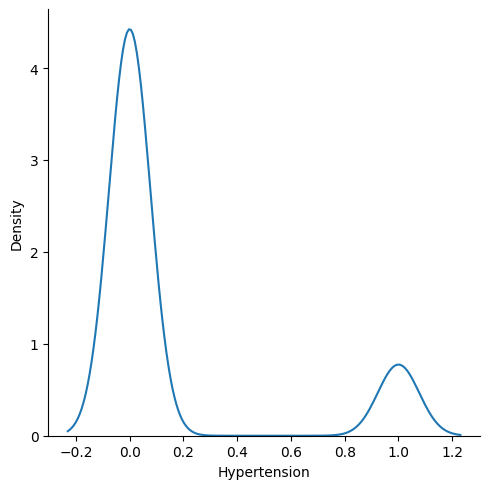

In [51]:
# Investigate hypertension
sns.displot(x = data_23['Hypertension'],kind="kde")

In [52]:
# Code to identify all Outliers (might not be needed; see plots above)
def find_outliers_iqr(data_23):
    Q1 = data_23.quantile(0.25)
    Q3 = data_23.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data_23[(data_23 < lower_bound) | (data_23 > upper_bound)]

for column in data_23.select_dtypes(include=['float64', 'int64']):
    outliers = find_outliers_iqr(data_23[column])
    if not outliers.empty:
        print(f"\nOutliers in '{column}':\n", outliers)
        


Outliers in 'Hypertension':
 8       1
11      1
15      1
17      1
30      1
       ..
2129    1
2133    1
2140    1
2142    1
2143    1
Name: Hypertension, Length: 320, dtype: int64


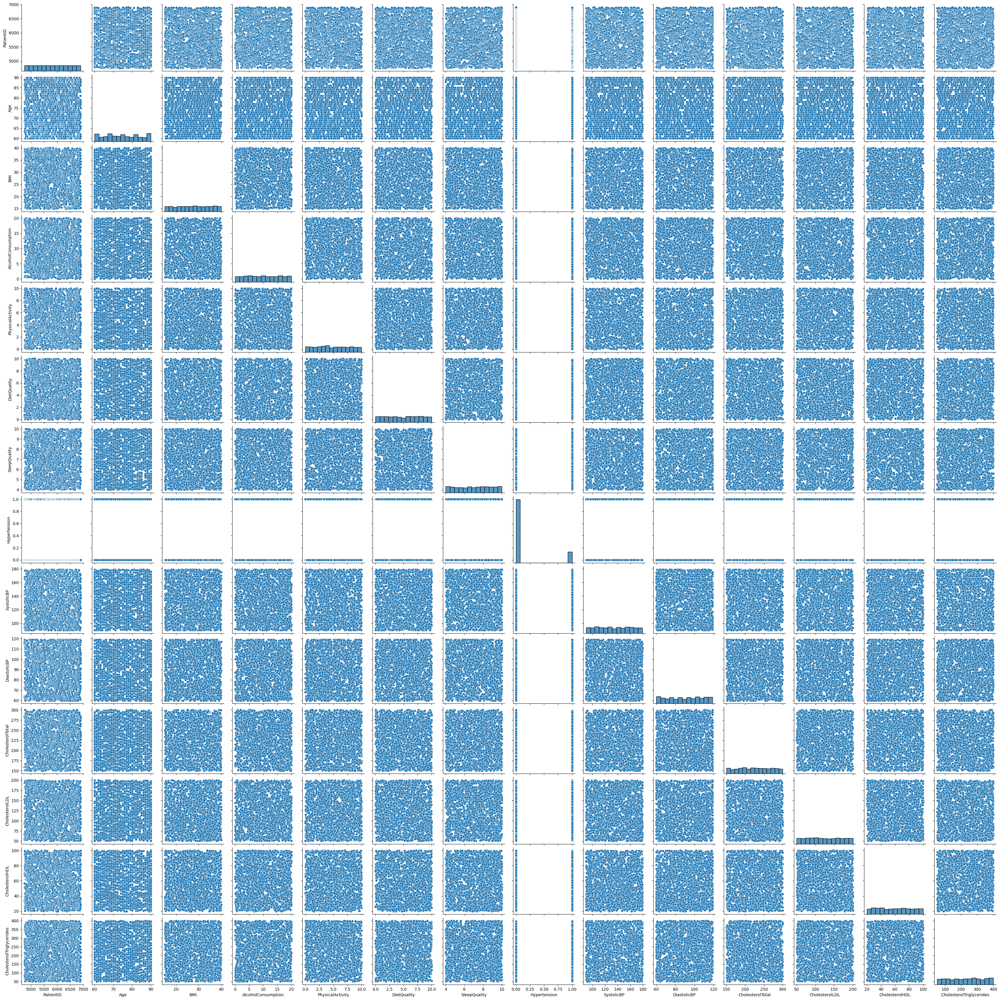

In [7]:
# TO DO: do this but by sub categories (e.g., lifestyle factors, demographics etc)
# At the moment, too many variables!
# https://seaborn.pydata.org/generated/seaborn.pairplot.html
sns.pairplot(data_23)


#### TO Dos for data cleaning / exploration

* Tidy up sections in this notebook
* Make plots ready for including in final report (titles, x and y labels etc); use seaborn!
* Investigate Hypertension outliers (we need to figure out what the value actually is and whether the outliers are meaningful)
* Check categorical variables only have expected values (check against Kaggle info)
* Look at how features relate (e.g., heatmap; https://seaborn.pydata.org/generated/seaborn.heatmap.html)


### Saving clean data to a new file
When finished with cleaning and exploration, save out datasets.

In [162]:
# Save clean datasets to deriv folder
data_23.to_csv('deriv/alzheimers_disease_data_23_clean.csv', index=None)
data_9.to_csv('deriv/alzheimers_disease_data_9_clean.csv', index=None)
